# Algorithm A

### Imports

In [1]:
import pandas as pd
import numpy as np
import statistics as st
import matplotlib
import seaborn
import matplotlib.dates as md
from matplotlib import pyplot as plt

from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.covariance import EllipticEnvelope
from sklearn.ensemble import IsolationForest
from sklearn.svm import OneClassSVM
from sklearn.preprocessing import MinMaxScaler
from statsmodels.tsa.seasonal import seasonal_decompose
from stldecompose import decompose
from statsmodels.tsa.stattools import adfuller
import logging
from sklearn.metrics import mean_squared_error

### Test Stationarity function definition

In [3]:
def test_stationarity(timeseries):
    """Performs  Dickey-Fuller test to test stationairty"""
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)

### Anchor Function definition

In [3]:
def anchor(signal, weight):
    """Data Smooothing"""
    buffer = []
    last = signal[0]
    for i in signal:
        smoothed_val = last * weight + (1 - weight) * i
        buffer.append(smoothed_val)
        last = smoothed_val
    return buffer

### Abline Function Definition

In [2]:
def abline(slope, intercept):
    """Plots a line from slope and intercept"""
    axes = plt.gca()
    x_vals = np.array(axes.get_xlim())
    y_vals = intercept + slope * x_vals
    plt.plot(x_vals, y_vals, '--')

### Strongest Trend Period Definition

In [5]:
def strongest_trend_period(ts, start, end):
    """Trend Detection, ts shape(x, )"""
    trend_strengths = []
    for i in range(start, end):
        decomposition = decompose(ts, period = i)
        var_residual = np.power(st.stdev(decomposition.resid), 2)
        var_trend_residual = np.power(st.stdev(anchor(decomposition.trend, 0.9) + decomposition.resid), 2)
        trend_strength = max(0, (1 - var_residual/var_trend_residual))
        trend_strengths.append(trend_strength)
    d = dict()
    d["index"] = trend_strengths.index(max(trend_strengths))
    d["period"] = d["index"] + 1
    d["trend_strength"] = max(trend_strengths)
    return d

### Strongest Seasonal Period Definition

In [6]:
def strongest_seasonal_period(ts, start, end):
    """Period Detecion, tx shape (x, )"""
    seasonal_strengths = []
    for i in range(start, end):
        decomposition = decompose(ts, period = i)
        var_residual = np.power(st.stdev(decomposition.resid), 2)
        var_seasonal_residual = np.power(st.stdev(decomposition.seasonal + decomposition.resid), 2)
        seasonality_strength = max(0, (1 - var_residual/var_seasonal_residual))
        seasonal_strengths.append(seasonality_strength)
    d = dict()
    d["index"] = seasonal_strengths.index(max(seasonal_strengths))
    d["period"] = d["index"] + 1
    d["seasonality_strength"] = max(seasonal_strengths)
    return d

### Remove Trend Definition

In [7]:
def remove_trend(ts, p):
    """Remove Trend, ts shape (x, )"""
    decomposition = decompose(ts, period = p)
    detrended = ts - decomposition.trend
    d = dict()
    d["detrended"] = detrended.reshape(detrended.shape[0], 1)
    d["trend"] = decomposition.trend.reshape(decomposition.trend.shape[0], 1)
    return d

### Linearity Score Definition

In [8]:
from sklearn.linear_model import LinearRegression
import statsmodels.formula.api as smf
def linearity_score(ts):
    """Linarity Score Detection"""
    x = [e for e in range(0, ts.shape[0])]
    x = np.array(x)
    trend_train_df = pd.DataFrame({'time': x, 'trend':ts})
    model_trend_train = smf.ols('time ~ trend', data = trend_train_df).fit()
    return model_trend_train.rsquared

### Scale Definition (-1, 1)

In [9]:
def scale(ts):
    """Scaling data, -1 to 1, ts shape (x, )"""
    scaler_ts = MinMaxScaler(feature_range = (-1, 1))
    scaler_ts = scaler_ts.fit(ts.values.reshape(-1, 1))
    ts_scaled = scaler_ts.transform(ts.values.reshape(-1, 1))
    ts_scaled = pd.DataFrame(ts_scaled)
    d = dict()
    d["scaler"] = scaler_ts
    d["scaled"] = ts_scaled #(x, 1)
    return d

### Linear Reg Definction

In [10]:
def linear_reg(train, start, end):
    """Performs Linear Regression, train shape (x, )"""
    x = [e for e in range(0, train.shape[0])]
    x = np.array(x)
    x_test = [e for e in range(start, end)]
    x_test = np.array(x_test)
    linearRegressor = LinearRegression()
    linearRegressor.fit(x.reshape(-1, 1), train.reshape(-1, 1))
    pred = linearRegressor.predict(x_test.reshape(-1, 1))
    return pred

### Configuration for Figure Size

In [11]:
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 20
fig_size[1] = 7

### Data Generation By ARMA

In [12]:
# ARMA example
# Data creation, random data is created, ARMA is applied, its fitted values are usede as a TS
from statsmodels.tsa.arima_model import ARMA
import random

data = [random.randint(1, 100) for x in range(0, 100000)]
model = ARMA(data, order=(0, 1))
model_fit = model.fit(disp=False)
plt.plot(data[:1000])
test_stationarity(pd.Series(model_fit.fittedvalues))
Test Statistic is smaller than critical value => TS is stationary 
ts = model_fit.fittedvalues
print(type(ts))
plt.plot(ts[:100])

np.savetxt("stationary-arma-ts.csv", ts, delimiter=",", header = "Data")

### Trendy Data Generation

In [13]:
import random
import math
from statsmodels.tsa.arima_model import ARMA

x = [e for e in range(0, 1300)]
noise = [5*random.random() for i in range(0, 1300)]
y = []    
for j in range(len(x)):
    y.append(x[j])
y = np.array(y)
data = y + noise
plt.plot(data[:200])
print(data)

np.savetxt("trendy-ts-3.csv", data, delimiter=",", header = "Data")

### Periodic Data Generation

In [14]:
import random
import math
from statsmodels.tsa.arima_model import ARMA

x = [e for e in range(0, 1300)]
noise = [random.random() for i in range(0, 1300)]
x = np.arange(0, 195, 0.15);
y = np.sin(x)
scaler_y = MinMaxScaler(feature_range = (-1, 1))
scaler_y = scaler_y.fit(y.reshape(-1, 1))
y_scaled = scaler_y.transform(ts.values.reshape(-1, 1))
y = y_scaled.flatten()
data = y + noise
plt.plot(data[:200])

np.savetxt("seasonal-ts-sin.csv", data, delimiter=", header = "Data")

### Reading the data

In [15]:
#Stationry-Arma-Ts
#Trendy-Ts
#Seasonal-Ts
df = pd.read_csv("stationary-arma-ts.csv")
ts = df["# Data"]
ts = ts[:18000]
print(df['# Data'].describe())
print("\n")
print("Shape of TS: " + str(ts.shape))
print("Type of TS: " + str(type(ts)))

count    100000.000000
mean         50.594892
std           0.182923
min          50.149333
25%          50.452213
50%          50.595379
75%          50.737898
max          51.030051
Name: # Data, dtype: float64


Shape of TS: (18000,)
Type of TS: <class 'pandas.core.series.Series'>


### Scaling data to (-1, 1) range

In [17]:
ts_scaler = scale(ts)
ts_scaled = ts_scaler["scaled"]
batch_size = 50
epochs = 50

In [18]:
from __future__ import print_function
import matplotlib as mpl
from matplotlib import pyplot as plt
import mxnet as mx
from mxnet import gluon, autograd, nd
from mxnet.gluon import nn, rnn

ctx = mx.cpu()

### Spliting the data into train (70%) and test (30%) sets

In [19]:
whole_data_size = ts_scaled.shape[0]
train_data_size = int((whole_data_size*70)/100)
test_data_size = int((whole_data_size*30)/100)

ts_scaled = ts_scaled.values
train = ts_scaled[:train_data_size]
test = ts_scaled[train_data_size:]

print("Train set shape: " + str(train.shape))
print("Test set shape: " + str(test.shape))
print("\n")

train_sd = st.stdev(train.reshape(train_data_size, ))
train_mean = st.mean(train.reshape(train_data_size, ))
print("Train SD: " + str(train_sd))
print("Train Mean: " + str(train_mean))

ts_test = test
ts_train = train

Train set shape: (12600, 1)
Test set shape: (5400, 1)


Train SD: 0.4230143380527672
Train Mean: 0.009978437729321561


### Trend and Seasonality
##### Scaling for Trend and Detrended

In [22]:
#For Train
str_trd_train = strongest_trend_period(ts_train.reshape(ts_train.shape[0], ), 1, 25)
str_trd_train["period"]

detrended_train = remove_trend(ts_train.reshape(ts_train.shape[0], ), str_trd_train["period"])
if(linearity_score(detrended_train["trend"].reshape(detrended_train["trend"].shape[0], )) >= 0.8):
    ts_train = detrended_train["detrended"]
    ts_detrended_train_scaler = scale(pd.Series(ts_train.reshape(ts_train.shape[0], )))
    ts_train = ts_detrended_train_scaler["scaled"].values
    
str_period_train = strongest_seasonal_period(ts_train.reshape(ts_train.shape[0], ), 1, 25)
if(str_period_train["seasonality_strength"] >= 0.8):
    batch_size = str_period_train["period"]
    
#For Test
str_trd_test = strongest_trend_period(ts_test.reshape(ts_test.shape[0], ), 1, 25)
str_trd_test["period"]
detrended_test = remove_trend(ts_test.reshape(ts_test.shape[0], ), str_trd_test["period"])

if(linearity_score(detrended_test["trend"].reshape(detrended_test["trend"].shape[0], )) >= 0.8):
    ts_test = detrended_test["detrended"]
    ts_detrended_test_scaler = scale(pd.Series(ts_test.reshape(ts_test.shape[0], )))
    ts_test = ts_detrended_test_scaler["scaled"].values

### Creating Moving Average

### Network Architecture

In [25]:
#Generator
netG = nn.Sequential()
with netG.name_scope():
    netG.add(nn.Dense(batch_size))
    netG.add(nn.BatchNorm(momentum = 0.8))
    netG.add(nn.Dropout(0.3))
    netG.add(nn.Dense(batch_size+15))
    netG.add(nn.BatchNorm(momentum = 0.8))
    netG.add(nn.Dropout(0.3))
    netG.add(nn.Dense(2*(batch_size+15)))
    netG.add(nn.BatchNorm(momentum = 0.8))
    netG.add(nn.Dropout(0.3))
    netG.add(nn.Dense(1, activation = "tanh"))

#Discriminator
netD = nn.Sequential()
with netD.name_scope():
    netD.add(nn.Dense(batch_size, activation = "tanh"))
    netD.add(nn.Dense(15, activation = "tanh"))
    netD.add(nn.Dense(10, activation ='tanh'))
    netD.add(nn.Dense(10, activation ='tanh'))
    netD.add(nn.Dense(5, activation ='tanh'))
    netD.add(nn.Dense(batch_size))

# print(netG)
# print(netD)    

#loss
loss = gluon.loss.SoftmaxCrossEntropyLoss()

#initialize the generator and the discriminator
#assigning weights from Normal distribution 
netG.initialize(mx.init.Normal(0.02), ctx=ctx)
netD.initialize(mx.init.Normal(0.02), ctx=ctx)

#trainer for the generator and the discriminator
#appling an Optimazer to a set of parmas, takes the params of netG/D, and uses adam opt
trainerG = gluon.Trainer(netG.collect_params(), 'adam', {'learning_rate': 0.01})
trainerD = gluon.Trainer(netD.collect_params(), 'adam', {'learning_rate': 0.05})

### Training Loop Definition
##### Plotting The Behavior of the Dirscriminator Loss, the Generator Loss and MSE

In [26]:
#ts shape (x, 1)
# set up logging
from datetime import datetime
import os
import time

def train_loop(ts, batch_size, epochs):
    Y = nd.ones(shape=(ts.shape[0], 1))
    train_data = mx.io.NDArrayIter(ts, Y, batch_size, shuffle=False)

    real_label = mx.nd.ones((batch_size, ), ctx=ctx)
    fake_label = mx.nd.zeros((batch_size, ), ctx=ctx)
    metric = mx.metric.Accuracy()

    stamp =  datetime.now().strftime('%Y_%m_%d-%H_%M')
    logging.basicConfig(level=logging.DEBUG)
    
    g_loss = []
    d_loss = []
    mse = []

    for epoch in range(epochs):
        tic = time.time()
        train_data.reset()
        iter = 0
        for i, batch in enumerate(train_data):
            #Updating D network: maximize log(D(x)) + log(1 - D(G(z)))
            data = batch.data[0].as_in_context(ctx)
            noise = nd.random_normal(0, 1, shape=(batch_size, ts.shape[1]), ctx=ctx)
            
            with autograd.record():
                real_output = netD(data)
                errD_real = loss(real_output, real_label)

                fake = netG(noise)
                fake_output = netD(fake.detach())
                errD_fake = loss(fake_output, fake_label)
                errD = errD_real + errD_fake
                errD.backward()

            trainerD.step(batch_size)
            metric.update([real_label,], [real_output,])
            metric.update([fake_label,], [fake_output,])

            #Updating G network: maximize log(D(G(z)))
            with autograd.record():
                output = netD(fake)
                errG = loss(output, real_label)
                errG.backward()

            trainerG.step(batch_size)

        name, acc = metric.get()
        metric.reset()
        print('\nbinary training acc at epoch %d: %s=%f' % (epoch, name, acc))
        print('time: %f' % (time.time() - tic))

        if iter % 1024 == 0:
            logging.info('discriminator loss = %f, generator loss = %f, at iter %d epoch %d' 
                 %(nd.mean(errD).asscalar(), 
                   nd.mean(errG).asscalar(), iter, epoch))
            d_loss.append(nd.mean(errD).asscalar())
            g_loss.append(nd.mean(errG).asscalar())
        iter = iter + 1

        noise = nd.random_normal(0, 1, shape=(ts.shape[0], ts.shape[1]), ctx=ctx)
        fake = netG(noise)
        plt.plot(ts[:200, ], color = "#007d92", label = "Train")
        plt.plot(fake[:200, 0].asnumpy(), color = "#cd8fa3", label = "Generated")
        plt.xlabel("Time")
        plt.legend(loc = "upper left")
        plt.show()

        print("Error Rate: " + str(mean_squared_error(ts, fake.asnumpy())))
        mse.append(mean_squared_error(ts, fake.asnumpy()))
    
    #plotting behovior
    plt.plot(d_loss, color = "#cd8fa3", label = "Discriminator's Loss ")
    plt.legend(loc = "upper right")
    plt.xlabel("Number of Epochs")
    plt.ylabel("Discriminator Loss")
    plt.title("Behavior of Discriminator's Loss")
    plt.show()

    plt.plot(g_loss, color = "#f3166b", label = "Generator's Loss")
    plt.legend(loc = "upper right")
    plt.xlabel("Number of Epochs")
    plt.ylabel("Generator Loss")
    plt.title("Behavior of Generator's Loss")
    plt.show()

    plt.plot(g_loss, color = "#007d92", label = "MSE")
    plt.legend(loc = "upper right")
    plt.xlabel("Number of Epochs")
    plt.ylabel("MSE")
    plt.title("Behavior of MSE")
    plt.show()

INFO:root:discriminator loss = 1.386865, generator loss = 0.693422, at iter 0 epoch 0
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.font_manager:findfont: Matching :family=sans-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=10.0 to DejaVu Sans ('C:\\Users\\Hovo\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSans.ttf') with score of 0.050000.



binary training acc at epoch 0: accuracy=0.498016
time: 2.755086


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


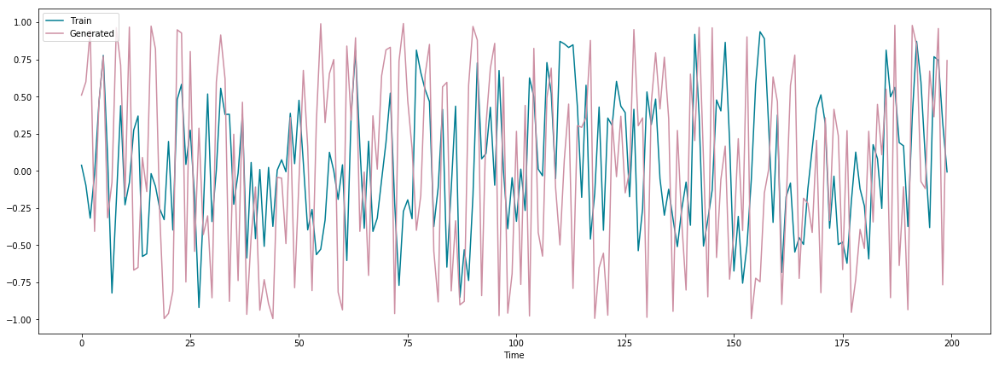

Error Rate: 0.5941887582372005


INFO:root:discriminator loss = 1.386647, generator loss = 0.693317, at iter 0 epoch 1
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 1: accuracy=0.500000
time: 2.838773


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


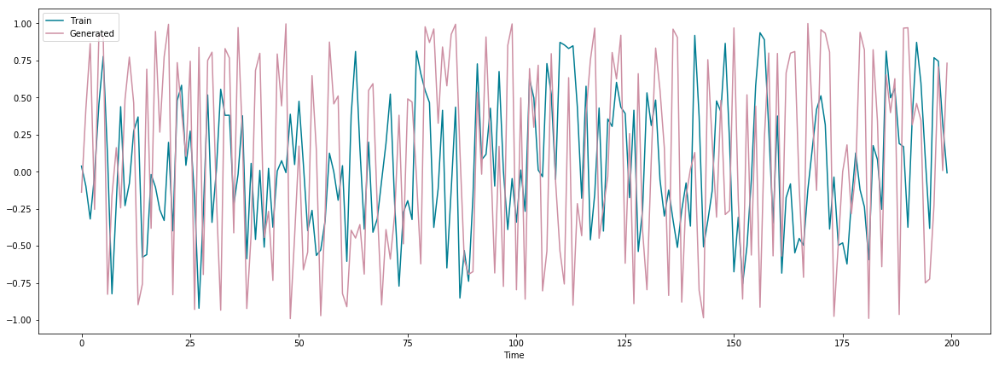

Error Rate: 0.6002803361265986


INFO:root:discriminator loss = 1.386524, generator loss = 0.693258, at iter 0 epoch 2
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 2: accuracy=0.500000
time: 2.945397


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


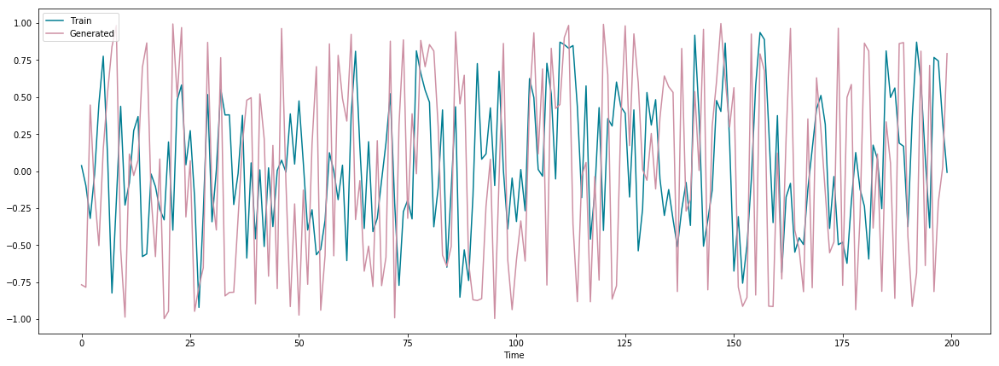

Error Rate: 0.5994937403533594


INFO:root:discriminator loss = 1.386454, generator loss = 0.693224, at iter 0 epoch 3
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 3: accuracy=0.500000
time: 3.038412


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


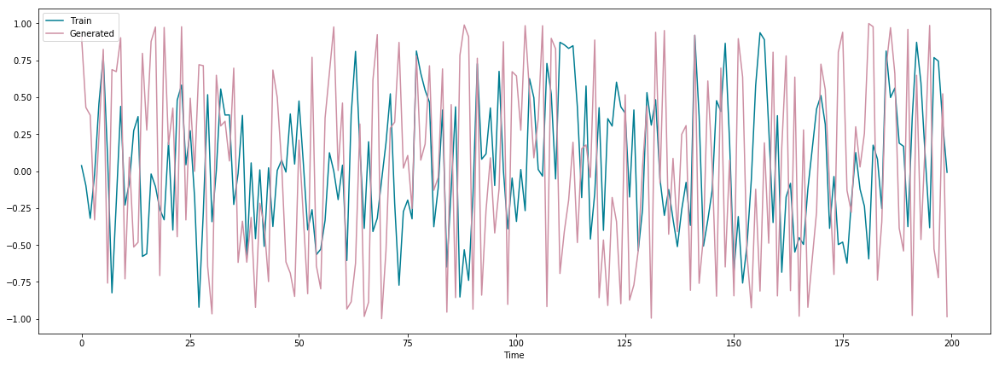

Error Rate: 0.6041789730958097


INFO:root:discriminator loss = 1.386411, generator loss = 0.693203, at iter 0 epoch 4
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 4: accuracy=0.500000
time: 4.541404


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


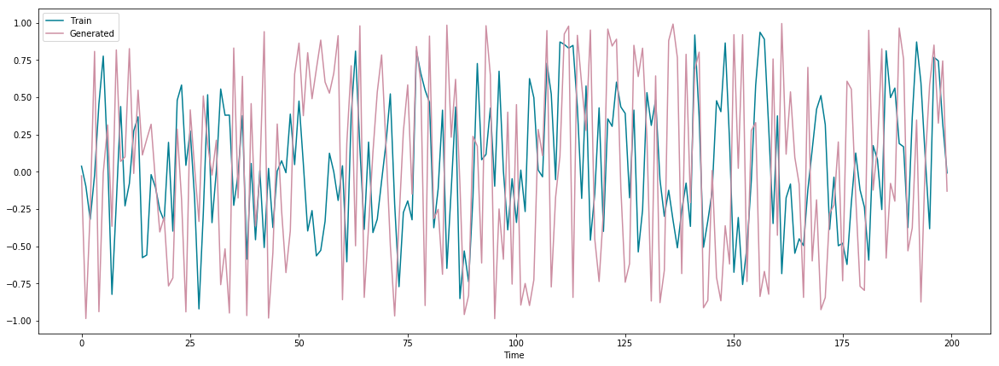

Error Rate: 0.6227287469241312


INFO:root:discriminator loss = 1.386382, generator loss = 0.693190, at iter 0 epoch 5
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 5: accuracy=0.500000
time: 3.001387


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


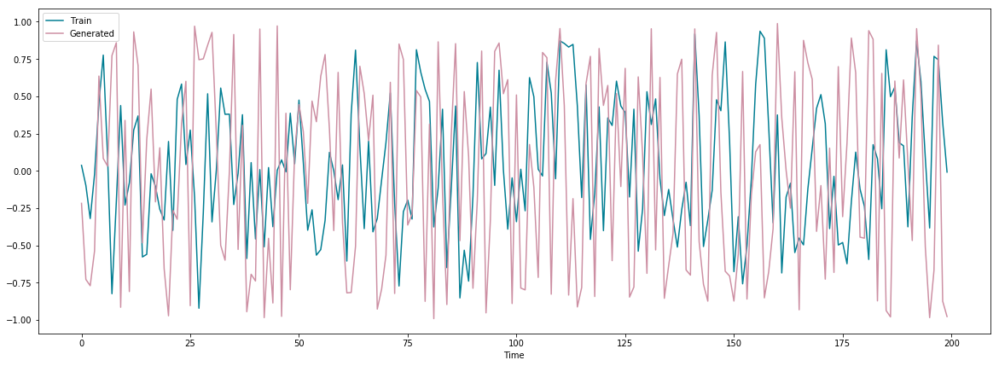

Error Rate: 0.5737457338713358


INFO:root:discriminator loss = 1.386363, generator loss = 0.693179, at iter 0 epoch 6
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 6: accuracy=0.500000
time: 3.204142


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


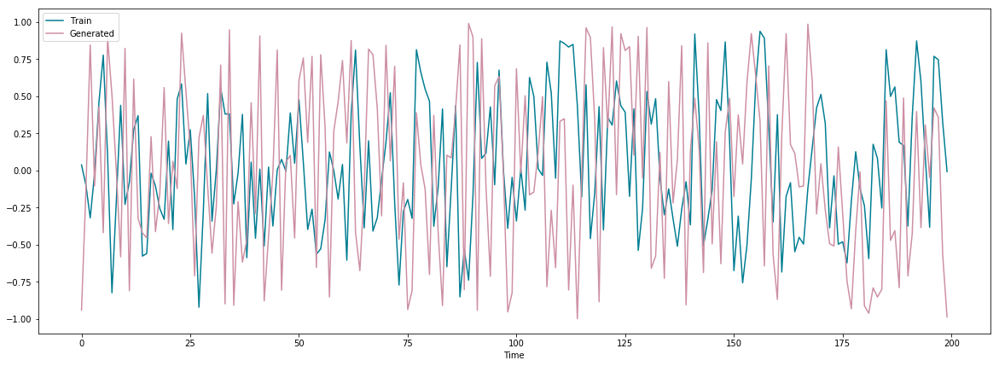

Error Rate: 0.5494565728342502


INFO:root:discriminator loss = 1.386351, generator loss = 0.693176, at iter 0 epoch 7
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 7: accuracy=0.500000
time: 2.931733


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


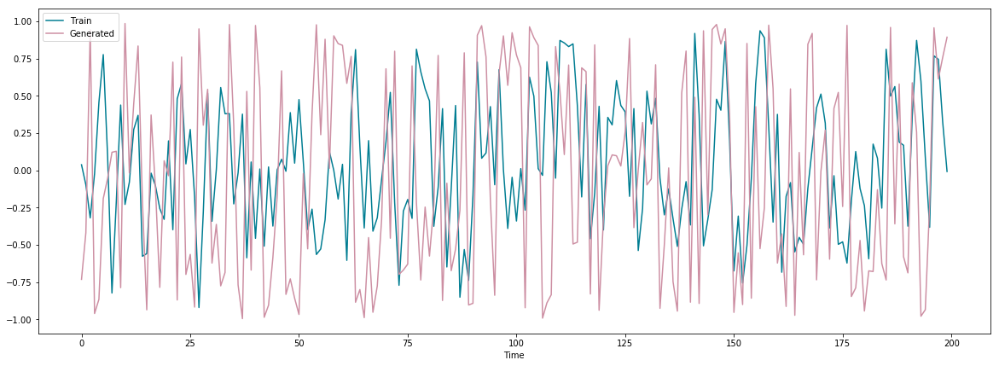

Error Rate: 0.6044834868442114


INFO:root:discriminator loss = 1.386340, generator loss = 0.693167, at iter 0 epoch 8
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 8: accuracy=0.500000
time: 3.199810


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


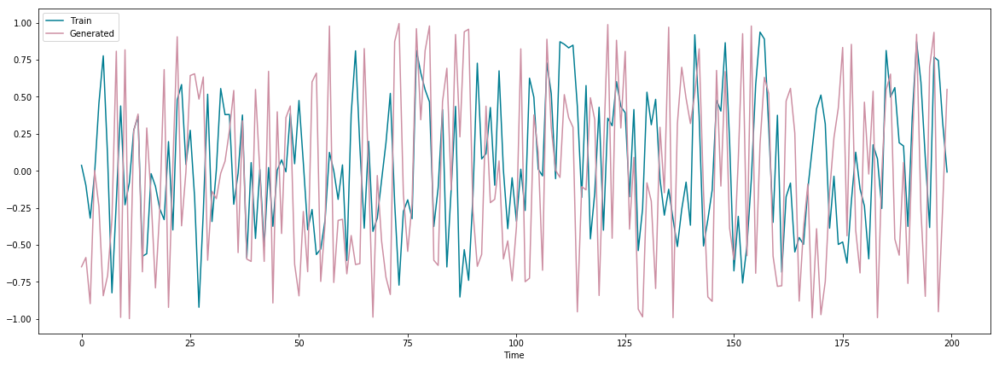

Error Rate: 0.580955829977256


INFO:root:discriminator loss = 1.386329, generator loss = 0.693165, at iter 0 epoch 9
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 9: accuracy=0.500000
time: 2.892159


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


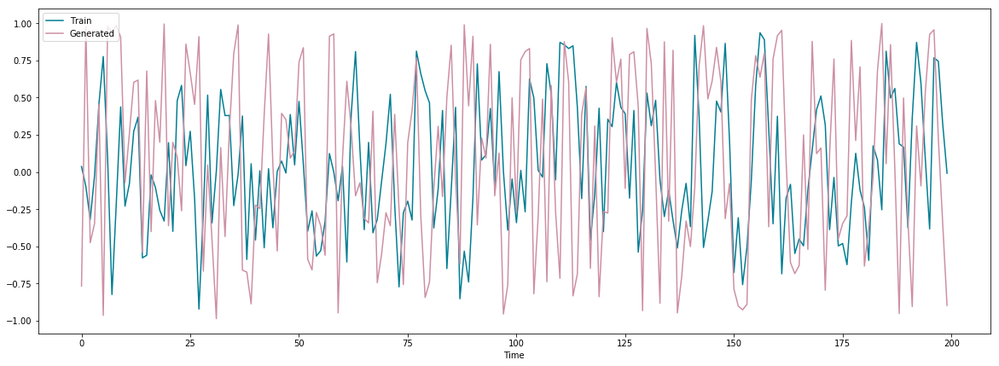

Error Rate: 0.589072055030636


INFO:root:discriminator loss = 1.386326, generator loss = 0.693161, at iter 0 epoch 10
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 10: accuracy=0.500000
time: 2.913473


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


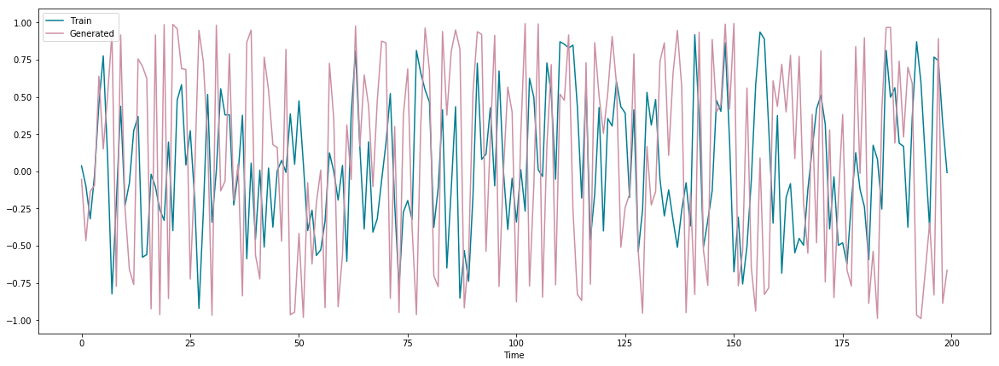

Error Rate: 0.5959211821741027


INFO:root:discriminator loss = 1.386318, generator loss = 0.693160, at iter 0 epoch 11
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 11: accuracy=0.500000
time: 2.891974


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


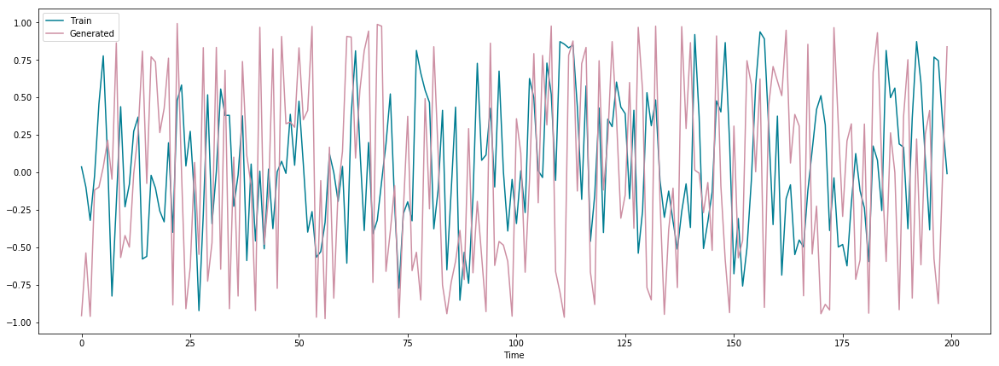

Error Rate: 0.5743934954377602


INFO:root:discriminator loss = 1.386317, generator loss = 0.693160, at iter 0 epoch 12
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 12: accuracy=0.500000
time: 2.879804


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


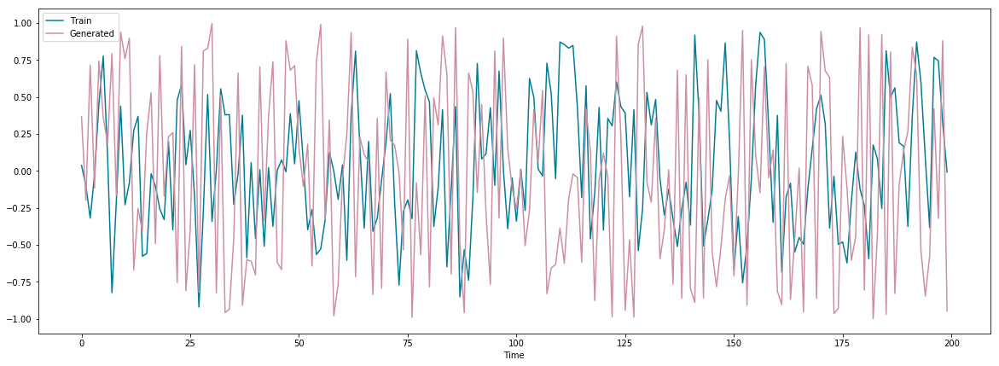

Error Rate: 0.5887031340132515


INFO:root:discriminator loss = 1.386312, generator loss = 0.693163, at iter 0 epoch 13
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 13: accuracy=0.500000
time: 3.275656


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


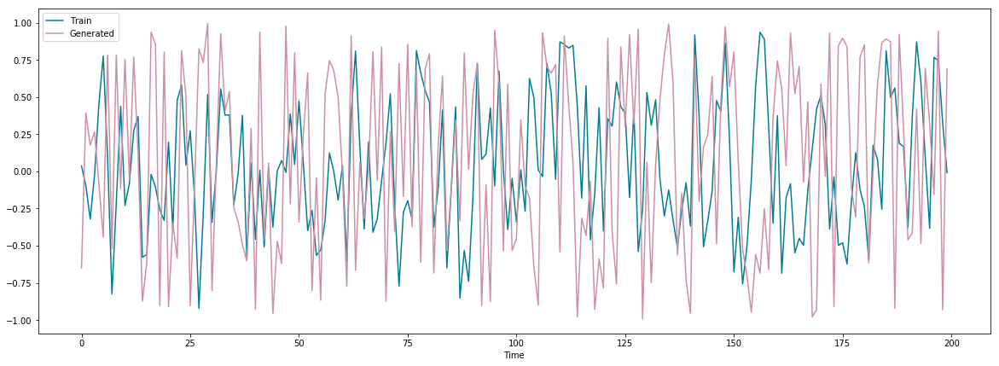

Error Rate: 0.5732839084285616


INFO:root:discriminator loss = 1.386311, generator loss = 0.692987, at iter 0 epoch 14
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 14: accuracy=0.500000
time: 2.918854


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


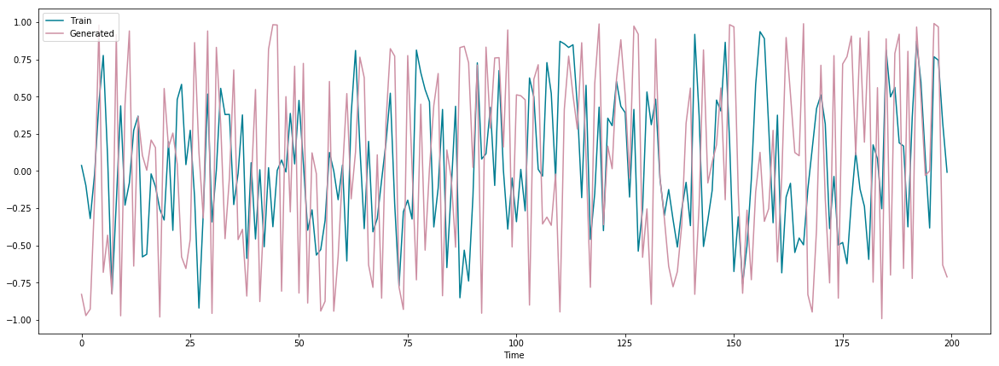

Error Rate: 0.5843227369464989


INFO:root:discriminator loss = 1.386306, generator loss = 0.693205, at iter 0 epoch 15
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 15: accuracy=0.500000
time: 2.913287


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


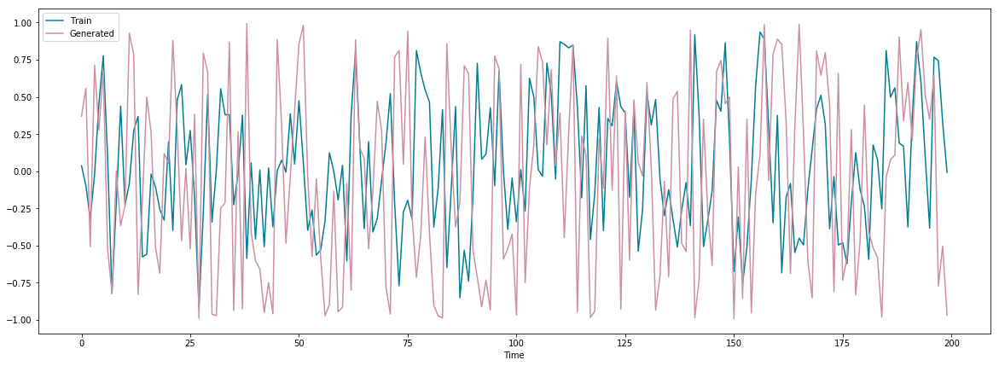

Error Rate: 0.5867173281674294


INFO:root:discriminator loss = 1.386306, generator loss = 0.693221, at iter 0 epoch 16
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 16: accuracy=0.500000
time: 2.825794


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


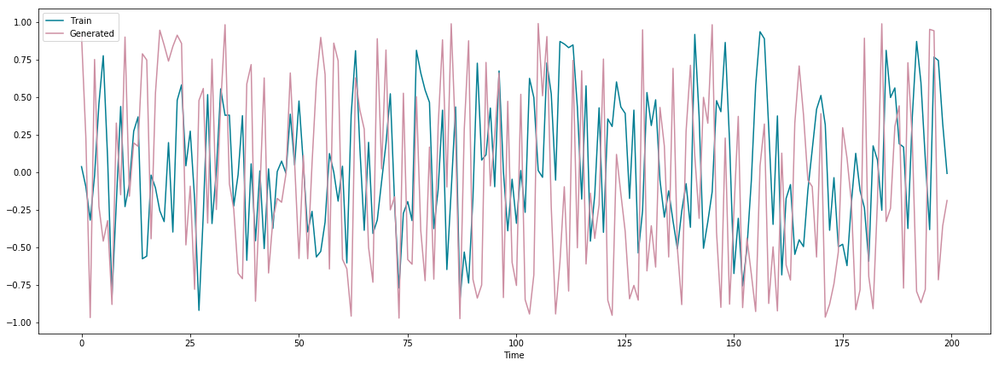

Error Rate: 0.5676657223120288


INFO:root:discriminator loss = 1.386306, generator loss = 0.693199, at iter 0 epoch 17
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 17: accuracy=0.500000
time: 2.819750


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


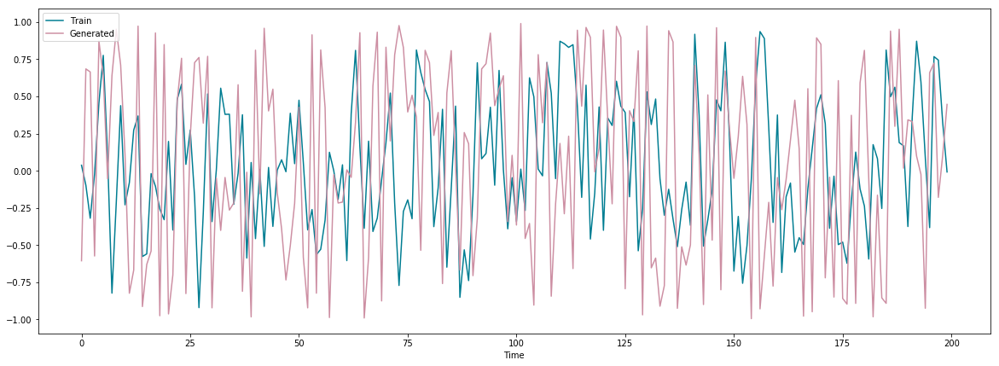

Error Rate: 0.5709847099078588


INFO:root:discriminator loss = 1.386304, generator loss = 0.693121, at iter 0 epoch 18
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 18: accuracy=0.500000
time: 3.132257


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


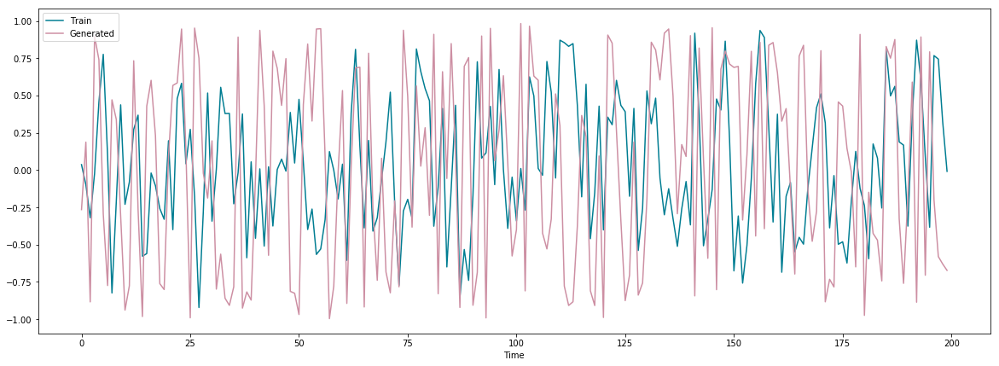

Error Rate: 0.5839539611947347


INFO:root:discriminator loss = 1.386611, generator loss = 0.675641, at iter 0 epoch 19
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 19: accuracy=0.500000
time: 2.856618


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


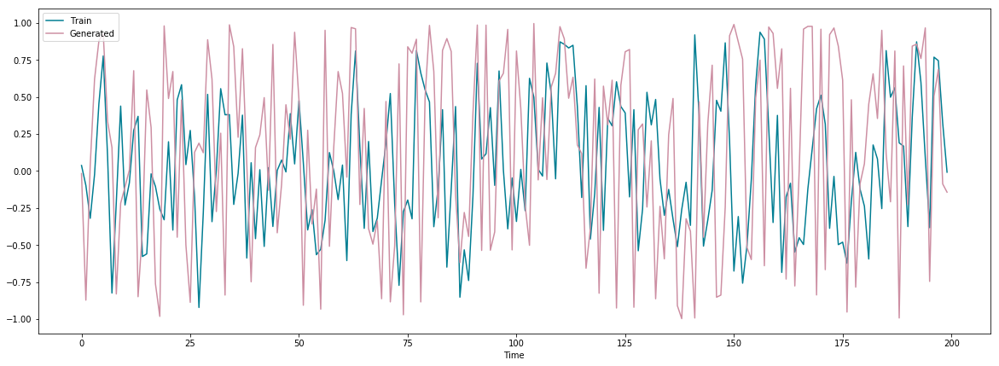

Error Rate: 0.5881457847396269


INFO:root:discriminator loss = 1.386317, generator loss = 0.698300, at iter 0 epoch 20
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 20: accuracy=0.500000
time: 2.874089


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


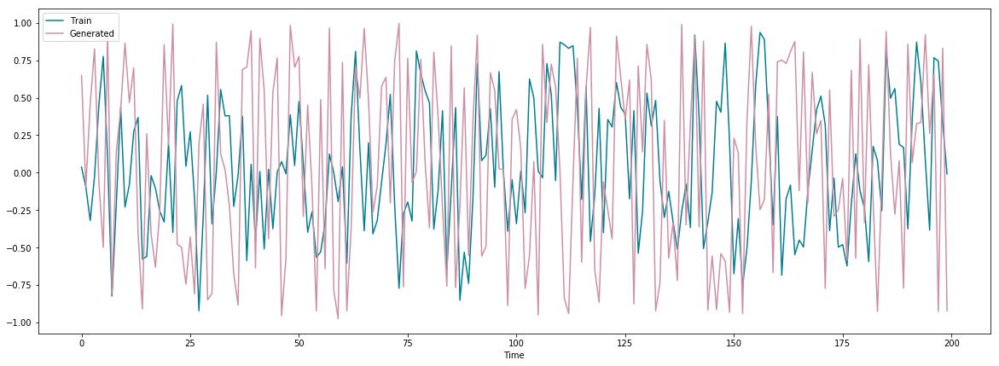

Error Rate: 0.5703677976144845


INFO:root:discriminator loss = 1.388396, generator loss = 0.734562, at iter 0 epoch 21
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 21: accuracy=0.500000
time: 2.994930


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


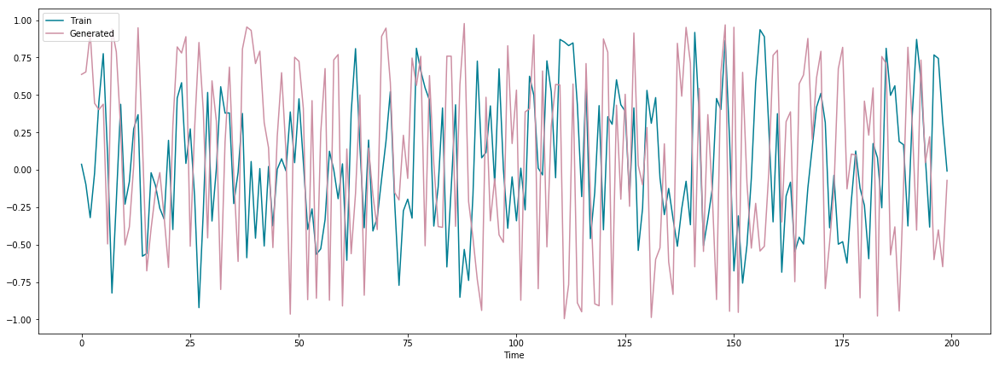

Error Rate: 0.5804496490452963


INFO:root:discriminator loss = 1.386720, generator loss = 0.667747, at iter 0 epoch 22
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 22: accuracy=0.500000
time: 3.210852


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


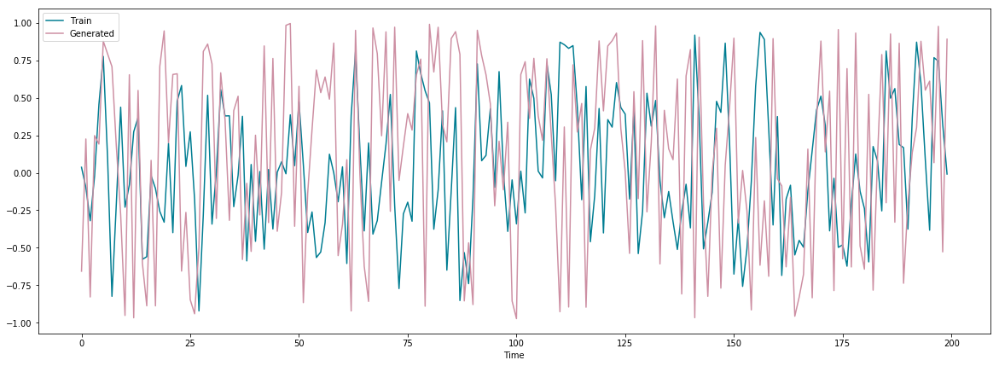

Error Rate: 0.6041213088732833


INFO:root:discriminator loss = 1.386313, generator loss = 0.697833, at iter 0 epoch 23
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 23: accuracy=0.500000
time: 2.890641


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


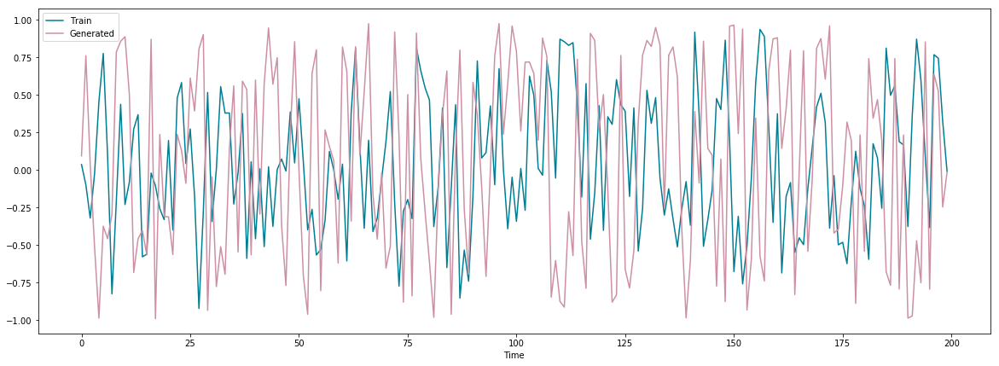

Error Rate: 0.5946274071001467


INFO:root:discriminator loss = 1.386300, generator loss = 0.693140, at iter 0 epoch 24
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 24: accuracy=0.500000
time: 2.798094


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


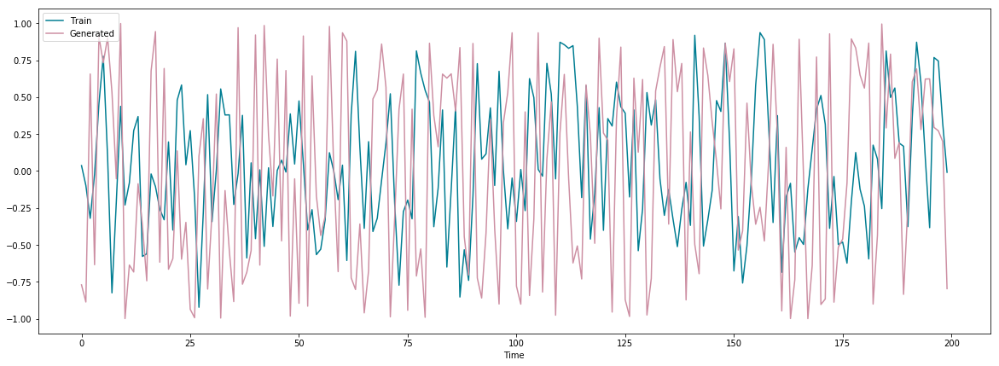

Error Rate: 0.6333041450025685


INFO:root:discriminator loss = 1.386298, generator loss = 0.693147, at iter 0 epoch 25
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 25: accuracy=0.500000
time: 2.860745


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


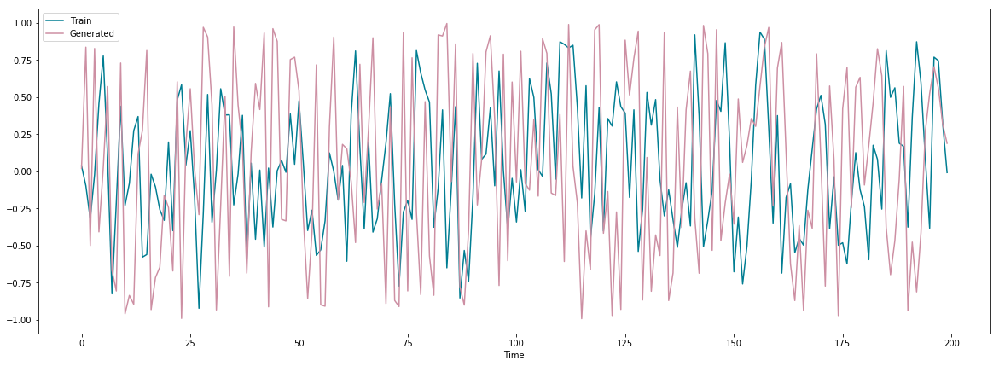

Error Rate: 0.5775636501386164


INFO:root:discriminator loss = 1.386300, generator loss = 0.693147, at iter 0 epoch 26
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 26: accuracy=0.500000
time: 2.895931


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


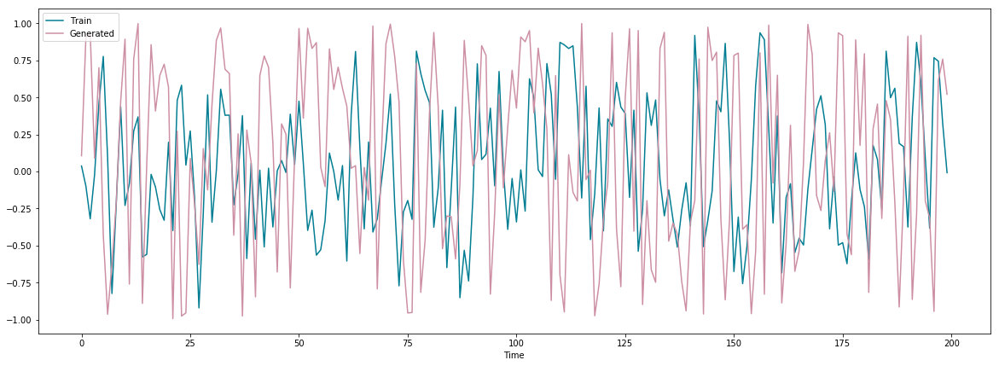

Error Rate: 0.6024447726041893


INFO:root:discriminator loss = 1.386302, generator loss = 0.691761, at iter 0 epoch 27
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 27: accuracy=0.500000
time: 3.151417


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


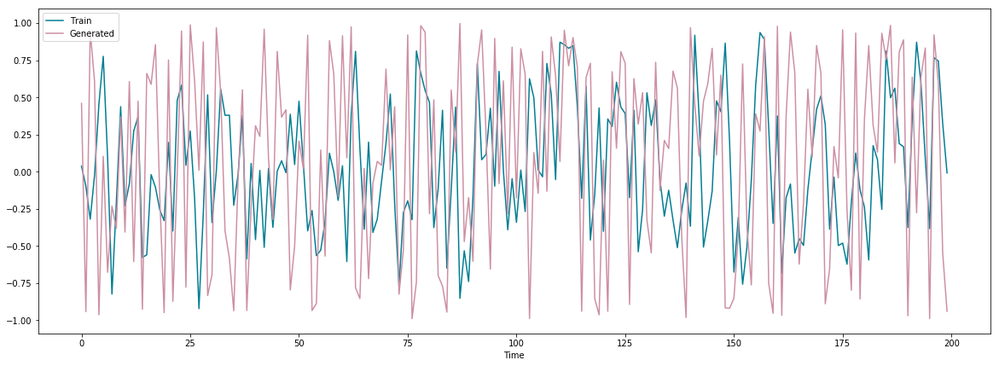

Error Rate: 0.6048108973147495


INFO:root:discriminator loss = 1.386299, generator loss = 0.692760, at iter 0 epoch 28
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 28: accuracy=0.500000
time: 2.861498


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


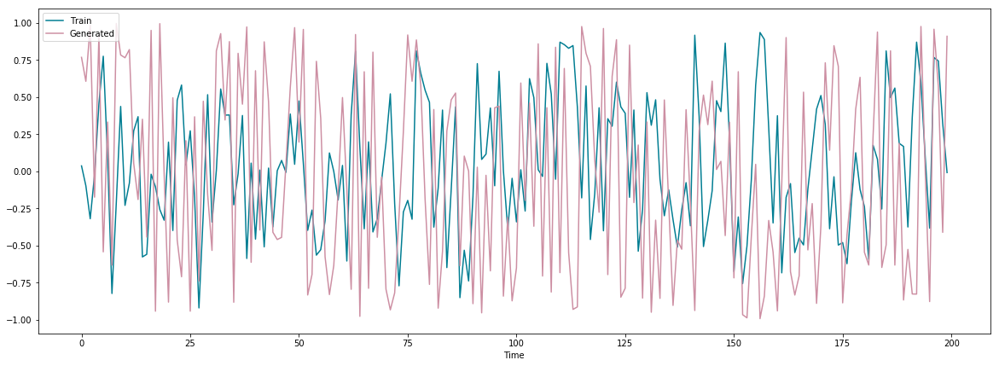

Error Rate: 0.6002702810604899


INFO:root:discriminator loss = 1.386294, generator loss = 0.693058, at iter 0 epoch 29
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 29: accuracy=0.500000
time: 2.826291


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


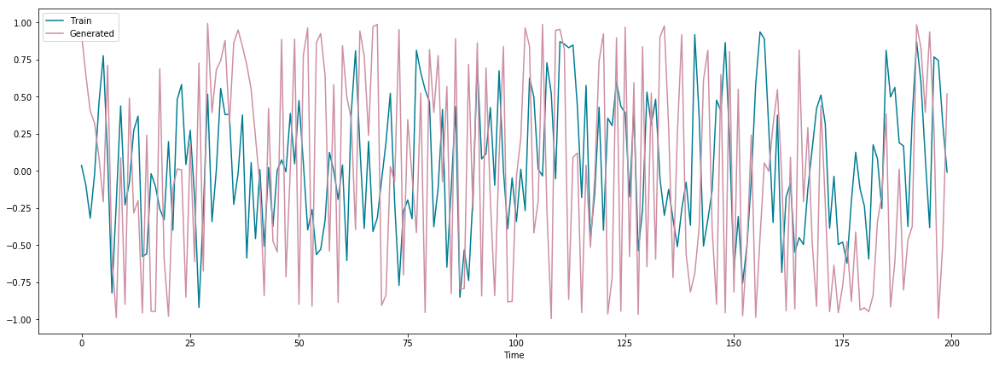

Error Rate: 0.6101462546065469


INFO:root:discriminator loss = 1.386294, generator loss = 0.692981, at iter 0 epoch 30
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 30: accuracy=0.500000
time: 2.860190


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


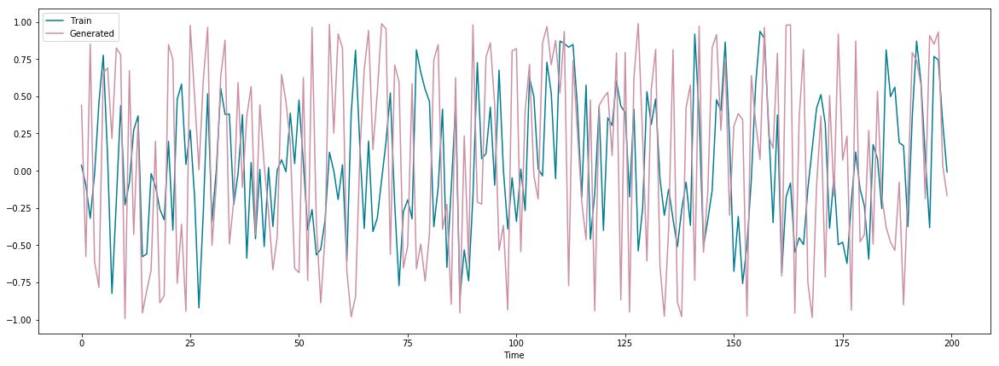

Error Rate: 0.5841672242981099


INFO:root:discriminator loss = 1.386294, generator loss = 0.693084, at iter 0 epoch 31
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 31: accuracy=0.500000
time: 2.869068


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


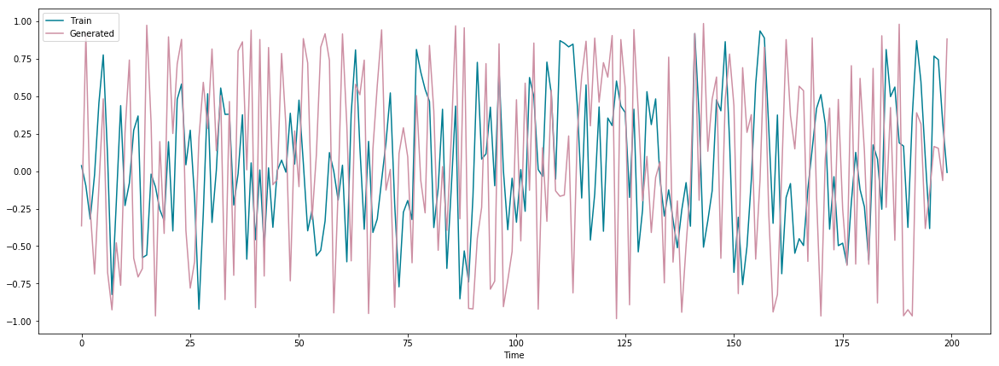

Error Rate: 0.5744090323380924


INFO:root:discriminator loss = 1.386294, generator loss = 0.693008, at iter 0 epoch 32
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 32: accuracy=0.500000
time: 3.127957


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


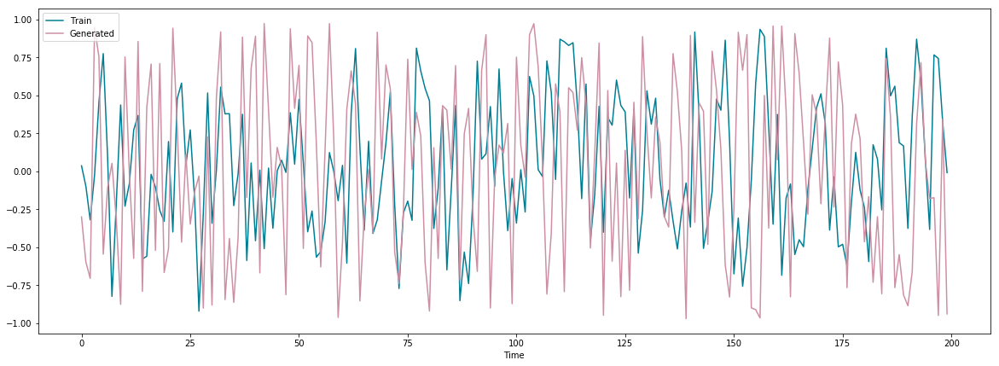

Error Rate: 0.5702727173058658


INFO:root:discriminator loss = 1.386294, generator loss = 0.693083, at iter 0 epoch 33
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 33: accuracy=0.500000
time: 2.910606


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


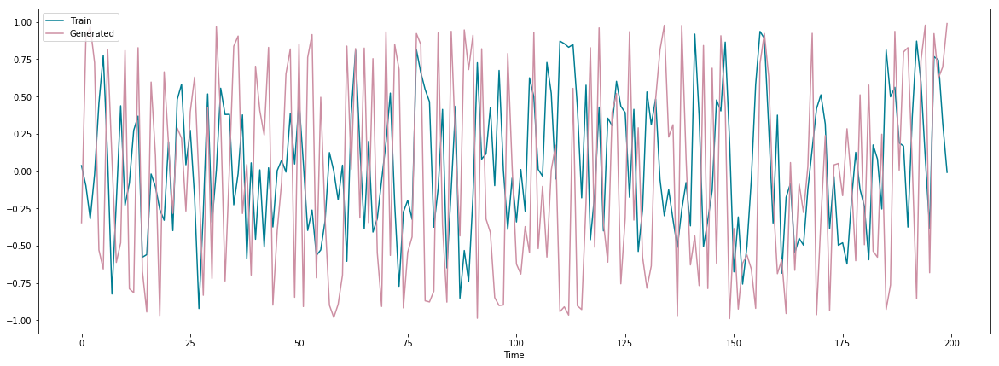

Error Rate: 0.5954892100384599


INFO:root:discriminator loss = 1.386294, generator loss = 0.693156, at iter 0 epoch 34
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 34: accuracy=0.500000
time: 3.180555


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


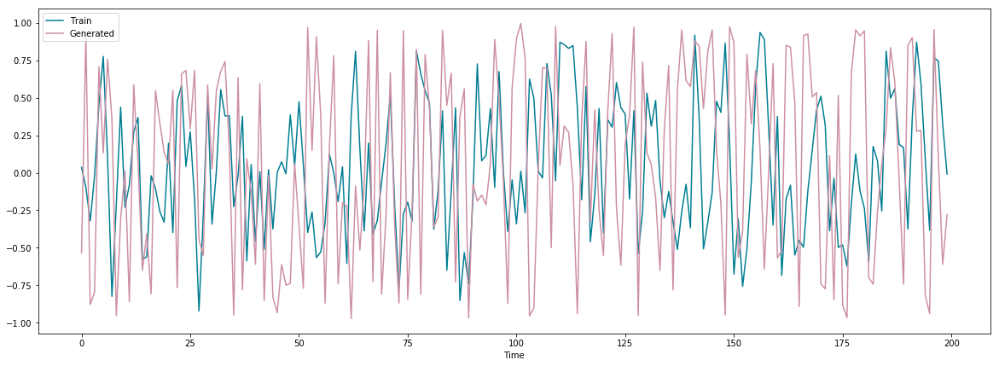

Error Rate: 0.5689276859511871


INFO:root:discriminator loss = 1.386294, generator loss = 0.693103, at iter 0 epoch 35
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 35: accuracy=0.500000
time: 2.809631


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


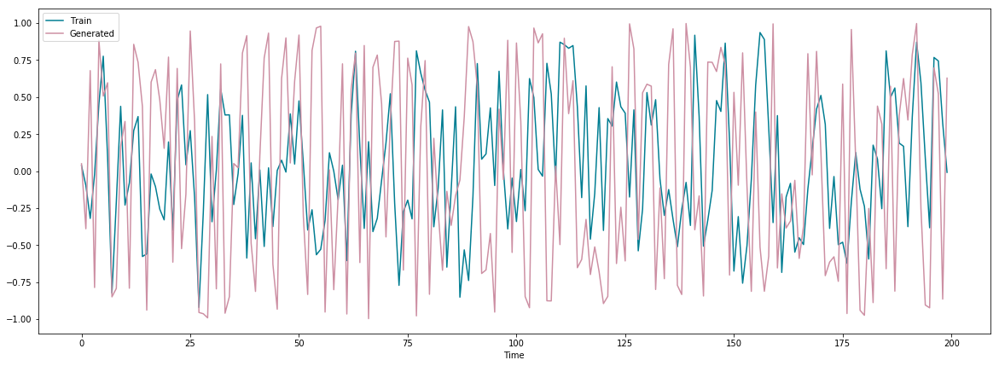

Error Rate: 0.6223301493705785


INFO:root:discriminator loss = 1.386294, generator loss = 0.693078, at iter 0 epoch 36
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 36: accuracy=0.500000
time: 2.857627


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


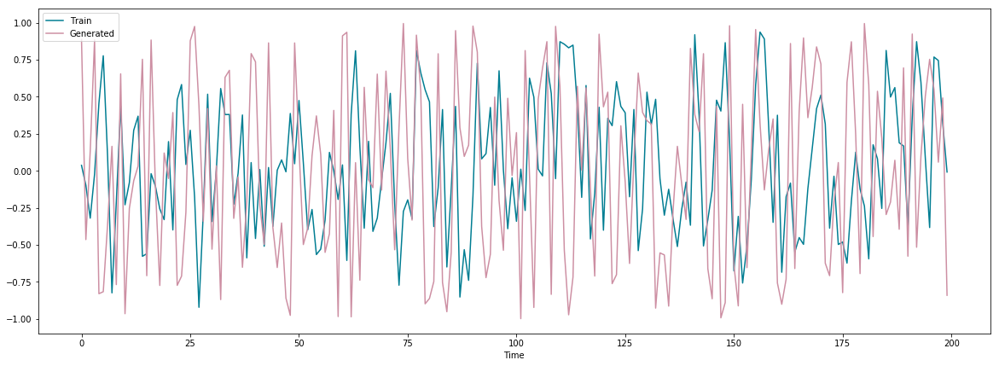

Error Rate: 0.580347437493928


INFO:root:discriminator loss = 1.386294, generator loss = 0.693130, at iter 0 epoch 37
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 37: accuracy=0.500000
time: 3.108119


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


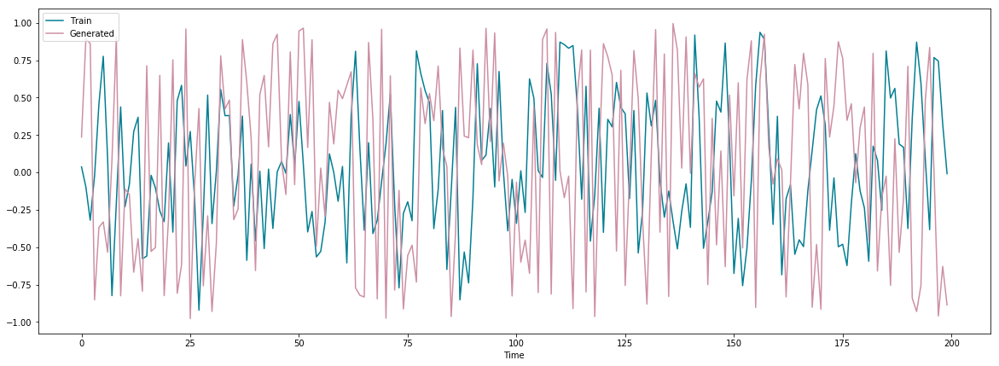

Error Rate: 0.5962197489842902


INFO:root:discriminator loss = 1.386295, generator loss = 0.692236, at iter 0 epoch 38
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 38: accuracy=0.500000
time: 2.872361


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


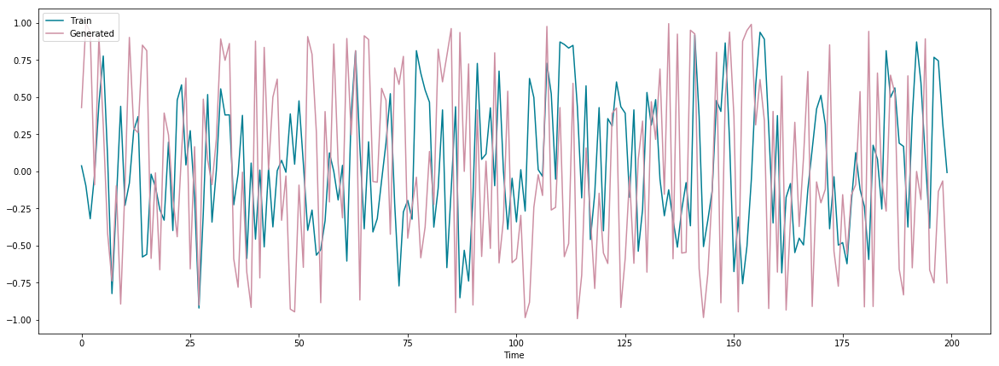

Error Rate: 0.5508812976052315


INFO:root:discriminator loss = 1.386391, generator loss = 0.673137, at iter 0 epoch 39
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 39: accuracy=0.500000
time: 2.864676


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


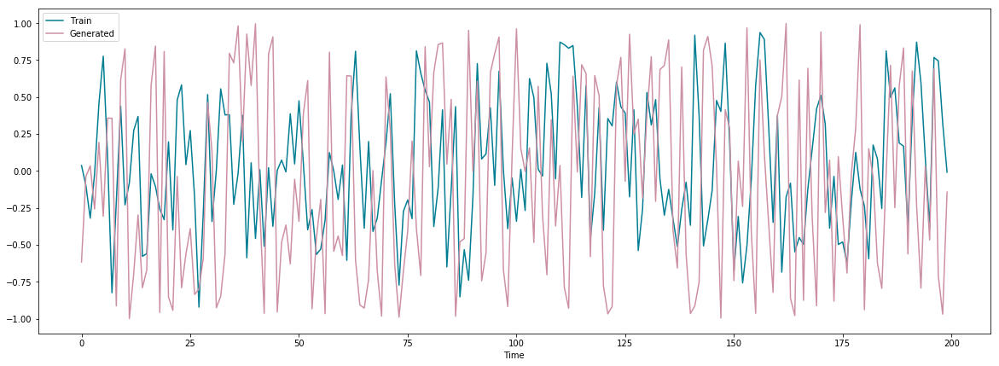

Error Rate: 0.5883192395107282


INFO:root:discriminator loss = 1.386298, generator loss = 0.690553, at iter 0 epoch 40
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 40: accuracy=0.500000
time: 2.827108


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


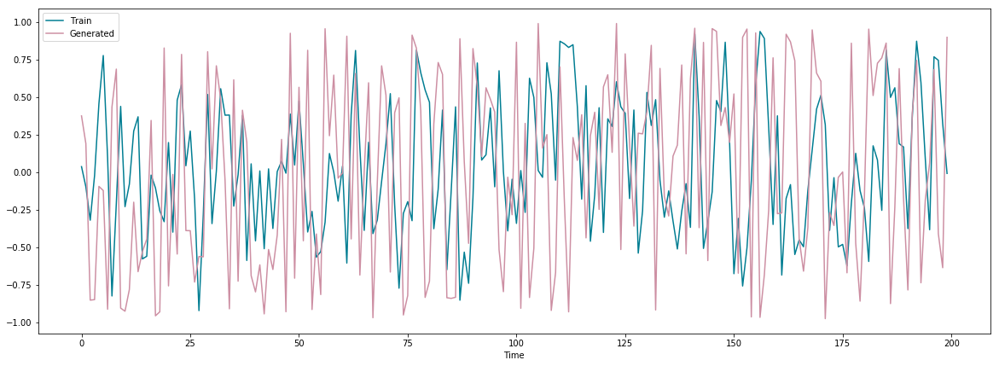

Error Rate: 0.585920814452135


INFO:root:discriminator loss = 1.386295, generator loss = 0.692812, at iter 0 epoch 41
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 41: accuracy=0.500000
time: 2.968614


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


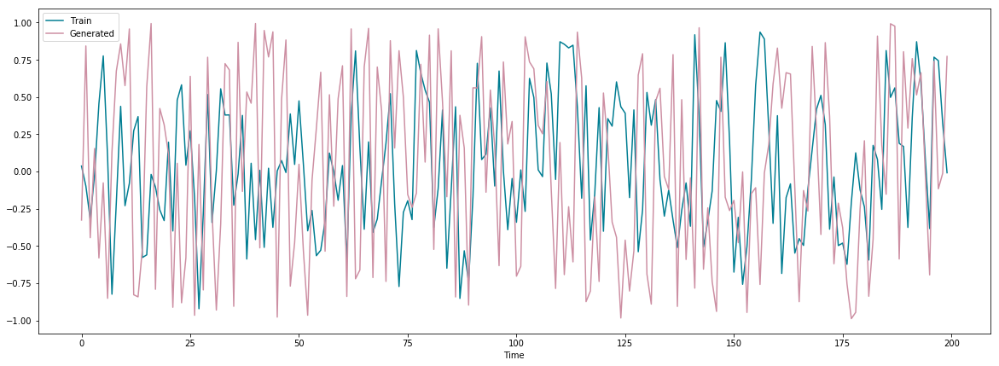

Error Rate: 0.6107905287003513


INFO:root:discriminator loss = 1.388669, generator loss = 0.646815, at iter 0 epoch 42
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 42: accuracy=0.500000
time: 3.200081


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


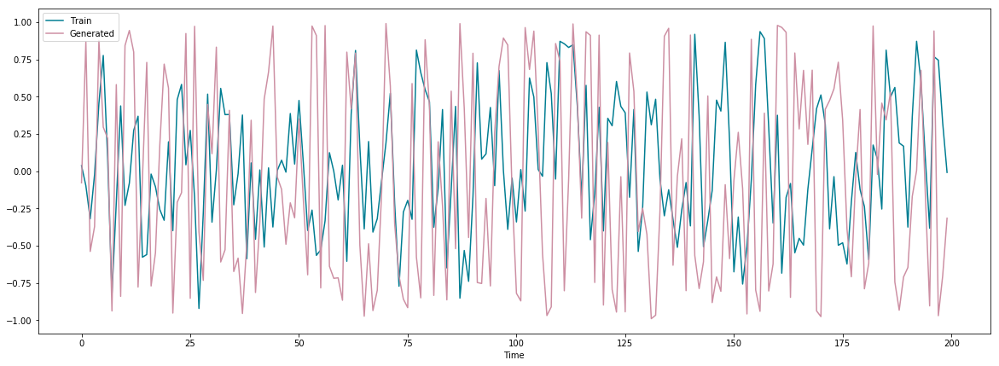

Error Rate: 0.589034416630196


INFO:root:discriminator loss = 1.386294, generator loss = 0.693174, at iter 0 epoch 43
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 43: accuracy=0.500000
time: 2.887817


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


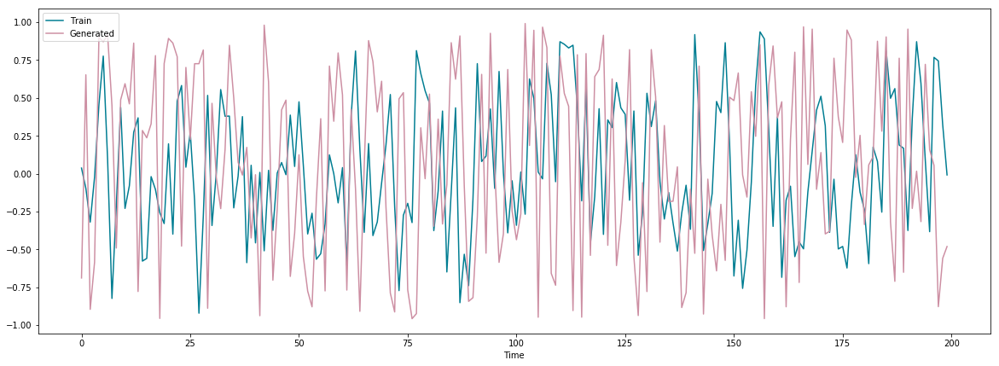

Error Rate: 0.5774825733050895


INFO:root:discriminator loss = 1.386294, generator loss = 0.693138, at iter 0 epoch 44
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 44: accuracy=0.500000
time: 3.042913


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


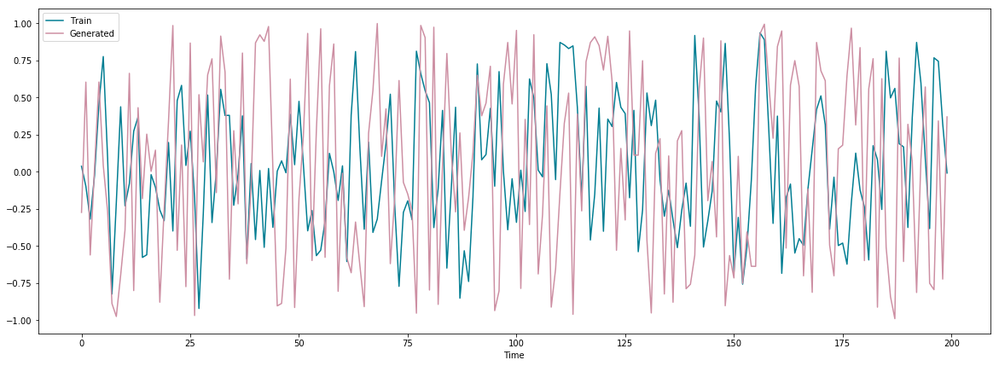

Error Rate: 0.5885880617532319


INFO:root:discriminator loss = 1.386294, generator loss = 0.693156, at iter 0 epoch 45
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 45: accuracy=0.500000
time: 2.983601


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


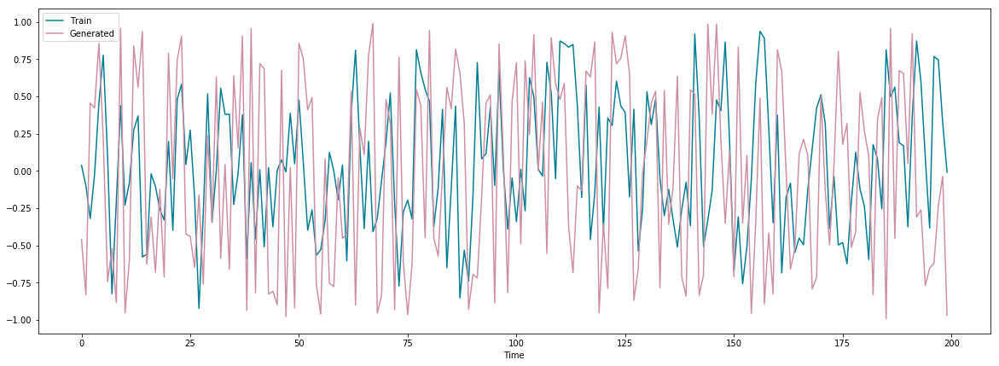

Error Rate: 0.5855119862842894


INFO:root:discriminator loss = 1.386294, generator loss = 0.693158, at iter 0 epoch 46
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 46: accuracy=0.500000
time: 3.212399


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


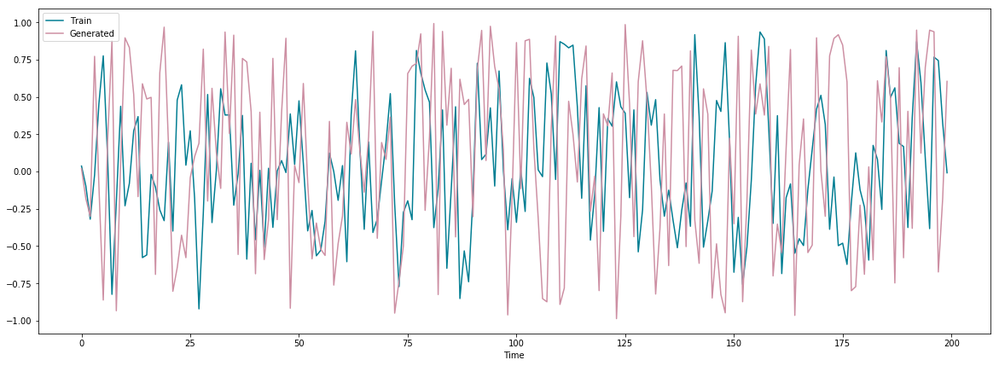

Error Rate: 0.5561396018662662


INFO:root:discriminator loss = 1.386294, generator loss = 0.693173, at iter 0 epoch 47
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 47: accuracy=0.500000
time: 2.823037


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


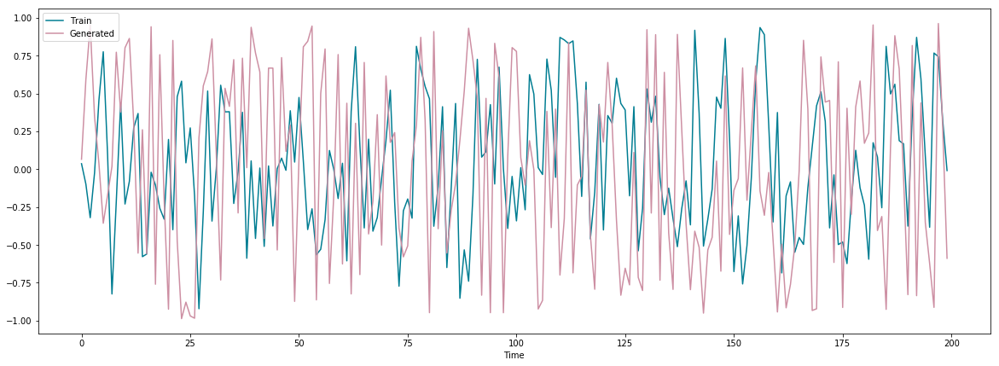

Error Rate: 0.5503601833247008


INFO:root:discriminator loss = 1.386294, generator loss = 0.693438, at iter 0 epoch 48
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 48: accuracy=0.500000
time: 2.819172


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


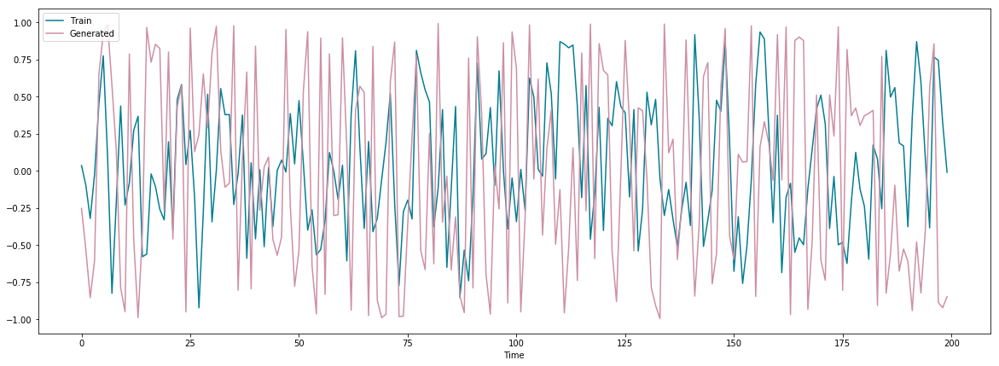

Error Rate: 0.6051455766533788


INFO:root:discriminator loss = 1.387649, generator loss = 0.665509, at iter 0 epoch 49
DEBUG:matplotlib.axes._base:update_title_pos



binary training acc at epoch 49: accuracy=0.500000
time: 2.846419


DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


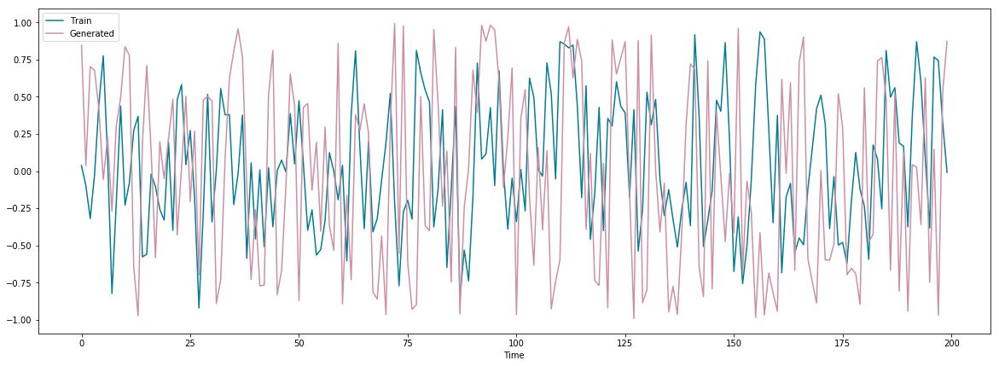

DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.font_manager:findfont: Matching :family=sans-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=12.0 to DejaVu Sans ('C:\\Users\\Hovo\\Anaconda3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSans.ttf') with score of 0.050000.
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


Error Rate: 0.6055116548968018


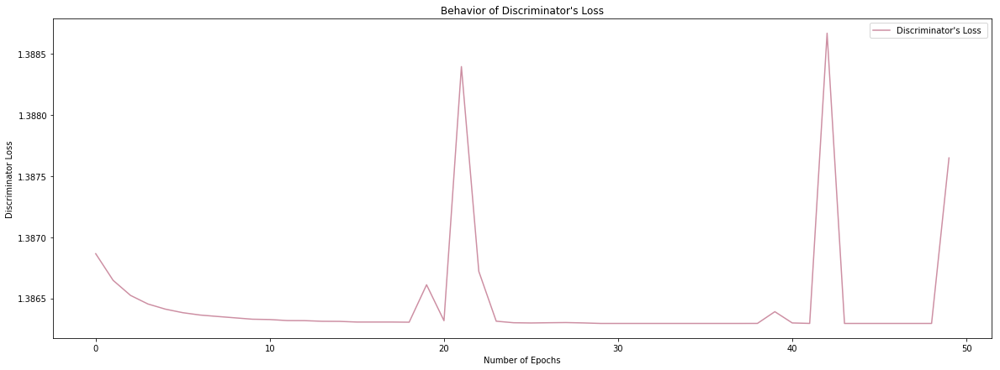

DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


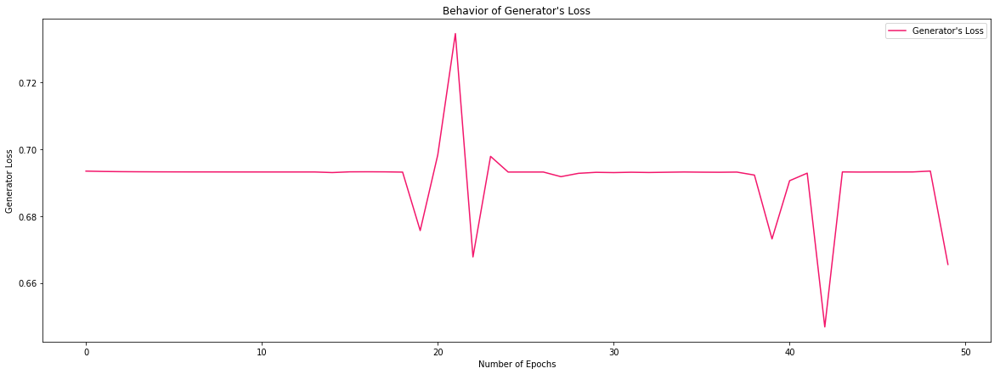

DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


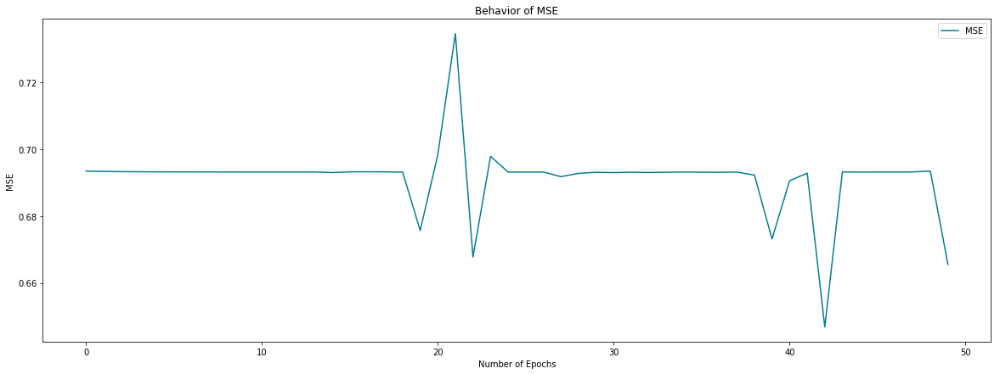

In [27]:
train_loop(ts_train, batch_size, epochs)

### Testing Process

DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


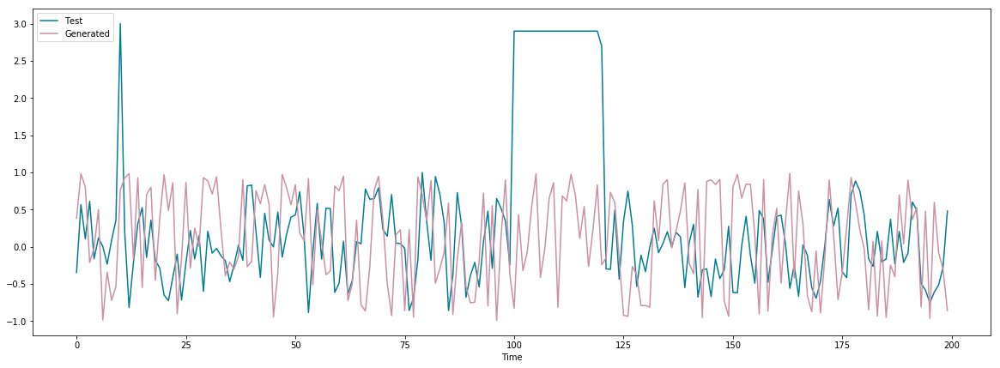

Test Error Rate: 0.6318595414466104


In [47]:
save = True
noise = nd.random_normal(0, 1, shape=(ts_test.shape[0], 1), ctx=ctx)

fake = netG(noise)

plt.plot(ts_test[:200, 0], color = "#007d92", label = "Test")
plt.plot(fake.asnumpy()[:200, 0],  color = "#cd8fa3", label = "Generated")
plt.legend(loc = "upper left")
plt.xlabel("Time")
plt.show()

print("Test Error Rate: " + str(mean_squared_error(ts_test, fake.asnumpy())))

if save == True:
    np.savetxt(("Version A//fake-" + str(batch_size) + "-" + str(50) + ".csv"),
               fake.asnumpy()[:, 0], delimiter=",", header = "Data")

### Rescaling

DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


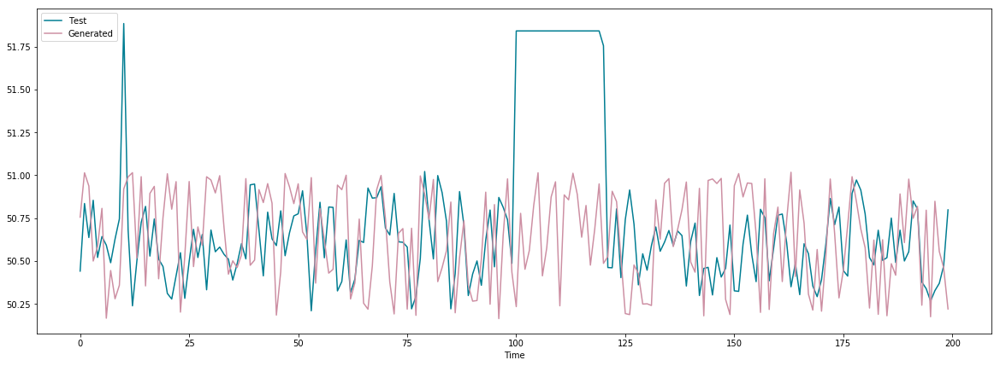

In [48]:
plt.plot(ts_scaler["scaler"].inverse_transform(ts_test[:200, ])[:, 0], color = "#007d92", label = "Test")
plt.plot(ts_scaler["scaler"].inverse_transform(fake.asnumpy()[:200, ])[:, 0],  color = "#cd8fa3", label = "Generated")
plt.legend(loc = "upper left")
plt.xlabel("Time")
plt.show()

### Used only for trendy/seasonal data only

In [52]:
diff = []

generated_inverese_scaled = ts_detrended_test_scaler["scaler"].inverse_transform(fake.asnumpy())
ts_test_original = ts_scaled[ts_scaled.shape[0] - ts_test.shape[0]:]
with_trend = generated_inverese_scaled + linear_reg(detrended_train["trend"].reshape(detrended_train["trend"].shape[0], ), detrended_train["trend"].shape[0], detrended_train["trend"].shape[0] + detrended_test["trend"].shape[0])

gen_rescaled = ts_scaler["scaler"].inverse_transform(generated_inverese_scaled)
ts_test_rescaled = ts_scaler["scaler"].inverse_transform(ts_test_original)
with_trend_rescaled = ts_scaler["scaler"].inverse_transform(with_trend)

ts_test_original_list = ts_test_rescaled[:, ].reshape(ts_test_rescaled.shape[0], )
with_trend_list = with_trend_rescaled[:, ].reshape(with_trend_rescaled.shape[0], )

for u in range(len(ts_test_original_list[:, ])):
    diff.append(abs(ts_test_original_list[u]-with_trend_list[u]))

residual_stdev = st.stdev(diff)

ub = with_trend_rescaled[:, 0] + (1.96*residual_stdev)
lb = with_trend_rescaled[:, 0] - (1.96*residual_stdev)

plt.plot(ts_test_rescaled[:50], color = "#007d92", label = "Test")
#plt.plot(with_trend_rescaled[:50], color = "#cd8fa3", label = "Generated")
plt.fill_between(x = df.index[:50], y1 = ub[:50, ], 
                 y2 = lb[:50, ], color = "gainsboro",
                 label = "Confidence Bounds") 
plt.legend(loc = "upper left")
plt.xlabel("Time")
plt.show()
print("The test error rate: " + str(mean_squared_error(ts_test_rescaled, with_trend_rescaled)))

NameError: name 'ts_detrended_test_scaler' is not defined

DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


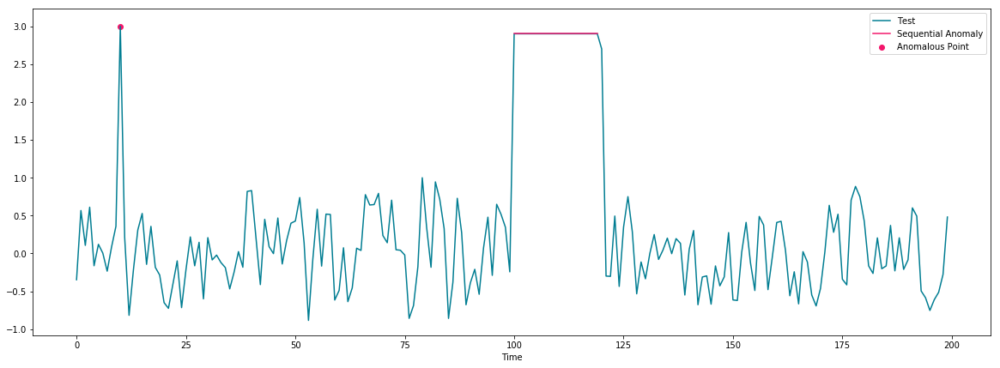

In [50]:
ts_test[100] = 2
ts_test[10] = 3
ts_test[120] = 2.7

for i in range(100, 120):
    ts_test[i] = 2.9
    
lol = ts_test[100:120]

for x in range(0, 100):
    lol = np.insert(lol, x, None, axis=0)

plt.plot(ts_test[:200, 0], color = "#007d92", label = "Test")
plt.plot(lol, color = "#f3166b", label = "Sequential Anomaly")
plt.scatter(x = 10, y = 3, color = "#f3166b", label = "Anomalous Point")
plt.legend(loc = "upper right")
plt.xlabel("Time")
plt.show()

### Anomaly detection

DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


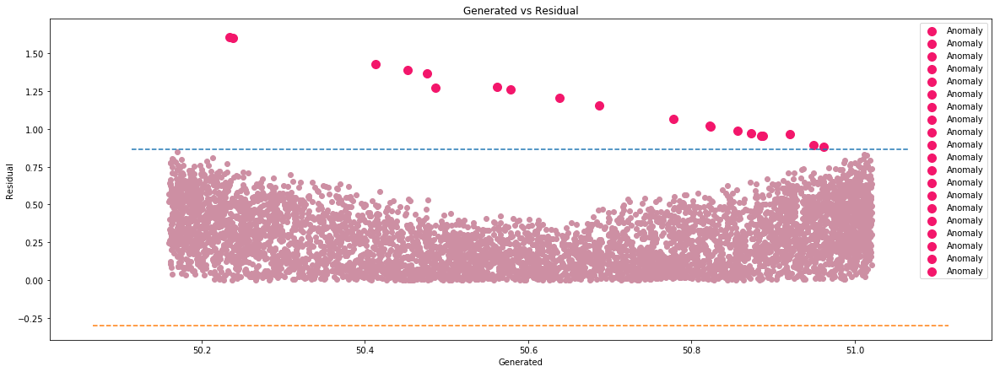

In [53]:
import math

diff = []
anomaly_indices = []

ts_test_rescaled = ts_scaler["scaler"].inverse_transform(ts_test[:, ])[:, 0]
fake_rescaled = ts_scaler["scaler"].inverse_transform(fake.asnumpy()[:, ])

ts_test_rescaled_list = ts_test_rescaled[:, ].reshape(ts_test_rescaled.shape[0], )
generated_list = fake_rescaled[:, ].reshape(ts_test_rescaled.shape[0], )

for u in range(len(ts_test_rescaled[:, ])):
    diff.append(abs(ts_test_rescaled_list[u]-generated_list[u]))

diff_list_df = pd.DataFrame({"residual": diff, 
                            "predicted": generated_list})
diff_list_df.head()

residual_mean = st.mean(diff)
residual_stdev = st.stdev(diff)
upper_bound = residual_mean + (3*residual_stdev)
lower_bound = residual_mean - (3*residual_stdev)

for i in range(diff_list_df.shape[0]):
    if diff_list_df.residual[i] < lower_bound:
        anomaly_indices.append(i)
    if diff_list_df.residual[i] > upper_bound:
        anomaly_indices.append(i)


plt.scatter(x = generated_list, y = diff, color = "#cd8fa3")
#plt.plot(diff[:200])
for i in range(len(anomaly_indices)):
    plt.scatter(x = generated_list[anomaly_indices[i]], y = diff[anomaly_indices[i]],
            marker = "o", alpha = 1, s = 100, color = "#f3166b", label = "Anomaly")
abline(0, upper_bound)
abline(0, lower_bound)
plt.xlabel("Generated")
plt.ylabel("Residual")
plt.title("Generated vs Residual")
plt.legend(loc = "upper right")
plt.show()


In [60]:
accuracy = (len(anomaly_indices)-1)/21

### Constructing Confidence Bounds for the Generated Data

DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


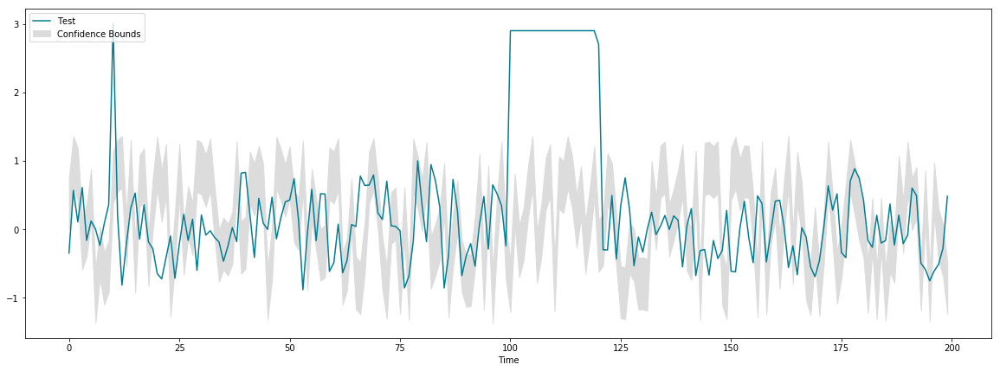

In [54]:
plt.plot(ts_test[:200, ], color = "#007d92", label = "Test")

#plt.plot(fake.asnumpy()[:200, 0],  color = "green", label = "Generated")
#plt.plot(fake.asnumpy()[:200, 0] + (1.96*residual_stdev), "--", color = "grey", label = "Upper Bound")
#plt.plot(fake.asnumpy()[:200, 0] - (1.96*residual_stdev), "--", color = "pink", label = "Lower Bound")
plt.fill_between(x = df.index[:200], y1 = fake.asnumpy()[:200, 0] + (1.96*residual_stdev), 
                 y2 = fake.asnumpy()[:200, 0] - (1.96*residual_stdev), color = "gainsboro", 
                 label = "Confidence Bounds")
plt.legend(loc = "upper left")
plt.xlabel("Time")
plt.show()

### Rescaling CI

DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos
DEBUG:matplotlib.axes._base:update_title_pos


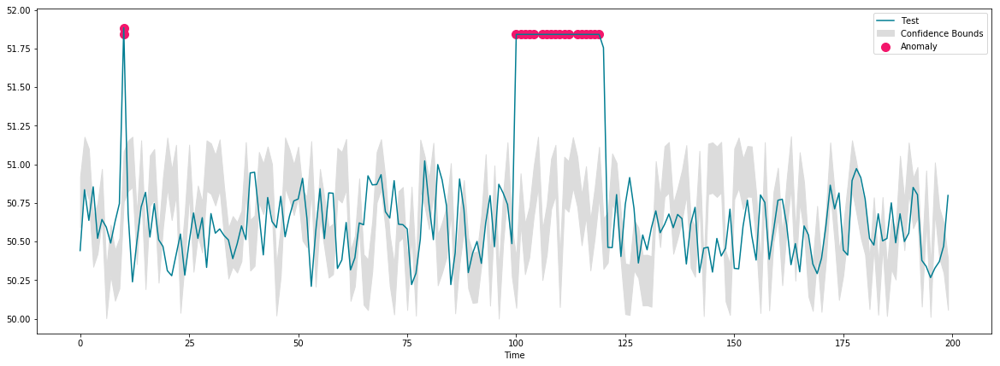

In [56]:
ts_test_rescaled = ts_scaler["scaler"].inverse_transform(ts_test[:, ])[:, 0]
ub_rescaled = ts_scaler["scaler"].inverse_transform(fake.asnumpy()[:, ] + (1.96*residual_stdev))
lb_rescaled = ts_scaler["scaler"].inverse_transform(fake.asnumpy()[:, ] - (1.96*residual_stdev))

plt.plot(ts_test_rescaled[:200, ], color = "#007d92", label = "Test")
#plt.plot(ts_scaler["scaler"].inverse_transform(fake.asnumpy()[:200, ])[:, 0],  color = "#cd8fa3", label = "Generated")

plt.fill_between(x = df.index[:200], y1 = ub_rescaled[:200, 0], 
                 y2 = lb_rescaled[:200, 0], color = "gainsboro", 
                 label = "Confidence Bounds")
plt.scatter(x = anomaly_indices[0], y = ts_test_rescaled[anomaly_indices[i], ],
        marker = "o", alpha = 1, s = 100, color = "#f3166b", label = "Anomaly")
for i in range(len(anomaly_indices) - 1):
    plt.scatter(x = anomaly_indices[i], y = ts_test_rescaled[anomaly_indices[i], ],
            marker = "o", alpha = 1, s = 100, color = "#f3166b")
plt.legend(loc = "upper right")
plt.xlabel("Time")
plt.show()

### Residual Summary

In [ ]:
import scipy

print("Residual Summary")
print("Correlation: " + str(scipy.stats.pearsonr(diff, generated_list)[0]))
print("Mean: " + str(st.mean(diff)))
print("SD: " + str(st.stdev(diff)))

### Averaged Version and Confidence Bounds

In [ ]:
fake_10_50 = pd.read_csv("Version A//fake-10-50.csv")
fake_10_50 = fake_10_50["# Data"].values

fake_20_50 = pd.read_csv("Version A//fake-20-50.csv")
fake_20_50 = fake_20_50["# Data"].values

fake_25_50 = pd.read_csv("Version A//fake-25-50.csv")
fake_25_50 = fake_25_50["# Data"].values

fake_30_50 = pd.read_csv("Version A//fake-30-50.csv")
fake_30_50 = fake_30_50["# Data"].values

fake_36_50 = pd.read_csv("Version A//fake-36-50.csv")
fake_36_50 = fake_36_50["# Data"].values

fake_mean = (fake_10_50 +  fake_36_50 + fake_30_50)/3
#fake_mean = (fake_10_50 + fake_15_50 + fake_20_50 + fake_25_50 + fake_30_50)/5

diff = []

ts_test_rescaled = ts_scaler["scaler"].inverse_transform(ts_test[:, ])
fake_mean_rescaled = ts_scaler["scaler"].inverse_transform(fake_mean.reshape(fake_mean.shape[0], 1)[:, ])

ts_test_rescaled_list = ts_test_rescaled[:, ].reshape(ts_test_rescaled.shape[0], )
generated_mean_list = fake_mean_rescaled[:, ].reshape(ts_test_rescaled.shape[0], )


for u in range(len(ts_test_rescaled_list[:, ])):
    diff.append(abs(ts_test_rescaled_list[u]-generated_mean_list[u]))

diff_list_df = pd.DataFrame({"residual": diff, 
                            "predicted": generated_mean_list})

residual_mean = st.mean(diff)
residual_stdev = st.stdev(diff)

ub = fake_mean_rescaled + (1.96*residual_stdev)
lb = fake_mean_rescaled - (1.96*residual_stdev)

#plt.plot(ts_test[0:200, 0], color = "#007d92", label = "Test")
plt.plot(ts_test_rescaled[0:200, 0], color = "#007d92", label = "Test")

#plt.plot(fake_10_50[:200, ],  color = "green", label = "Generated 10-70")
#plt.plot(fake_20_50[:200, ],  color = "black", label = "Generated 20-70")
#plt.plot(fake_30_50[:200, ],  color = "purple", label = "Generated 30-70")
#plt.plot(fake_mean[:200, ],  color = "#cd8fa3", label = "Generated Mean")
#plt.plot(fake_mean_rescaled[:200, ],  color = "#cd8fa3", label = "Generated Mean")

# plt.fill_between(x = df.index[:200], y1 = fake_mean[:200, ] + (1.96*residual_stdev), 
#                  y2 = fake_mean[:200, ] - (1.96*residual_stdev), color = "gainsboro",
#                  label = "Confidence Bounds For Mean")

plt.fill_between(x = df.index[:200], y1 = ub[:200, 0], 
                 y2 = lb[:200, 0], color = "gainsboro",
                 label = "Confidence Bounds For Mean")
plt.legend(loc = "upper left")
plt.xlabel("Time")
plt.show()

print("Test Error Rate: " + str(mean_squared_error(ts_test, fake_mean)))